https://www.kaggle.com/competitions/data-science-bowl-2018/data
Aqui es donde saque la Data set y viene toda la informacion del proyecto.
Para que tambien le des una checada jupiter =)
gracias amiguitos

# Caso practico U-Net con uso de LUNA dataset

In [2]:
!pip install tensorflow
!pip install pillow
!pip install scikit-image
!pip install 
!pip install matplotlib
!pip install scikit-learn

import tensorflow as tf
import os
import random
import numpy as np

from tqdm import tqdm
from PIL import Image

from skimage.io import imread, imshow
from skimage.transform import resize
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from keras import layers
import keras
from IPython.display import Image, display
from keras.utils import load_img
from keras import utils
from PIL import ImageOps
from tensorflow import data as tf_data
from tensorflow import image as tf_image
from tensorflow import io as tf_io
from tensorflow.keras import Model, models
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.optimizers import Adam
# son un monton de librerias =(

ERROR: You must give at least one requirement to install (see "pip help install")


**Prosesamiento de Datos**

In [3]:
from zipfile import ZipFile

# Extraer archivos del archivo ZIP a las carpetas correspondientes
with ZipFile("C:\\Users\\PC\\Downloads\\data-science-bowl-2018.zip", "r") as zip_ref:
    zip_ref.extractall("./stage1_train")  # Extraer a la carpeta de entrenamiento

# Normalmente, no es necesario extraer el mismo ZIP dos veces. Si hay un conjunto de prueba en el mismo ZIP,
# puedes usar el mismo comando para extraerlo a una carpeta diferente si existe.
# Si hay dos conjuntos (entrenamiento y prueba) en el mismo ZIP, usa algo como esto:
with ZipFile("C:\\Users\\PC\\Downloads\\data-science-bowl-2018.zip", "r") as zip_ref:
    zip_ref.extractall("./stage1_test")  # Extraer a la carpeta de prueba

In [13]:
import os
from zipfile import ZipFile

# Función para extraer archivos ZIP
def extract_zip_files(directory):
    for filename in os.listdir(directory):
        if filename.endswith('.zip'):
            zip_path = os.path.join(directory, filename)
            with ZipFile(zip_path, 'r') as zip_ref:
                zip_ref.extractall(directory)

# Extraer archivos ZIP de stage1_train
extract_zip_files('./stage1_train')

# Extraer archivos ZIP de stage1_test
extract_zip_files('./stage1_test')


In [14]:
print(os.listdir('./stage1_train'))
print(os.listdir('./stage1_test'))


['00071198d059ba7f5914a526d124d28e6d010c92466da21d4a04cd5413362552', '0019c086029dd3be01f72131edb74e21ee995574e6d5c136ea868630b0d73523', '003cee89357d9fe13516167fd67b609a164651b21934585648c740d2c3d86dc1', '004a078bb44ee55ee7d6f1c19f96b3a0d3b5037746a3a75197dbb0be06da05cf', '005463e6d4a0a0b21161f1d97392f22556fbddba970d9440ae774229308a91ed', '005af293e8e53218ae96746ecf9bb88b511154d4a0b35e4ec6296b4623e15836', '005d47447abac7f7fa0ac56ba82f13edbf485105baf0672504d84b58d562f38b', '00ac87390253a22f6eb67c5771a73050e06200d1aa682fcf1b1e3783b2944166', '00ae65c1c6631ae6f2be1a449902976e6eb8483bf6b0740d00530220832c6d3e', '00b4b9c026cfc91af21691503bad67081fc02d5c77b3cd27200d02dca6966b83', '00da4fe5346bbb36ccf178964a22fdf7e33888989624176a6af3b4a7cfd7da63', '00e36f2470960e84cfc9f0d30c1f76abd7b35e4516380bf74985cbe641086806', '00e67980783eaae30d41f6479beb9c04eb91de4608537673898039094800ddb0', '0109397492bc18b80e607146638ba9cd905506b0602d4dd67a0352d89d9494ab', '010c48f7f53524acf3e36b957046cb4f3ae731d346c192

In [15]:
IMG_WIDTH = 128
IMG_HEIGHT = 128
IMG_CHANNELS = 3

TRAIN_PATH = 'stage1_train/'
TEST_PATH = 'stage1_test/'

train_ids = [d for d in os.listdir(TRAIN_PATH) if os.path.isdir(os.path.join(TRAIN_PATH, d))]
test_ids = [d for d in os.listdir(TEST_PATH) if os.path.isdir(os.path.join(TEST_PATH, d))]

x = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
y = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=bool)

In [26]:
import os

# Verificar el contenido de las carpetas de entrenamiento y prueba
print("Contenido de la carpeta de entrenamiento:")
print(os.listdir('./stage1_train'))

print("Contenido de la carpeta de prueba:")
print(os.listdir('./stage1_test'))


Contenido de la carpeta de entrenamiento:
['00071198d059ba7f5914a526d124d28e6d010c92466da21d4a04cd5413362552', '0019c086029dd3be01f72131edb74e21ee995574e6d5c136ea868630b0d73523', '003cee89357d9fe13516167fd67b609a164651b21934585648c740d2c3d86dc1', '004a078bb44ee55ee7d6f1c19f96b3a0d3b5037746a3a75197dbb0be06da05cf', '005463e6d4a0a0b21161f1d97392f22556fbddba970d9440ae774229308a91ed', '005af293e8e53218ae96746ecf9bb88b511154d4a0b35e4ec6296b4623e15836', '005d47447abac7f7fa0ac56ba82f13edbf485105baf0672504d84b58d562f38b', '00ac87390253a22f6eb67c5771a73050e06200d1aa682fcf1b1e3783b2944166', '00ae65c1c6631ae6f2be1a449902976e6eb8483bf6b0740d00530220832c6d3e', '00b4b9c026cfc91af21691503bad67081fc02d5c77b3cd27200d02dca6966b83', '00da4fe5346bbb36ccf178964a22fdf7e33888989624176a6af3b4a7cfd7da63', '00e36f2470960e84cfc9f0d30c1f76abd7b35e4516380bf74985cbe641086806', '00e67980783eaae30d41f6479beb9c04eb91de4608537673898039094800ddb0', '0109397492bc18b80e607146638ba9cd905506b0602d4dd67a0352d89d9494ab', '010c

In [31]:
import os
import numpy as np
from skimage.io import imread
from skimage.transform import resize
from tqdm import tqdm

print('Resizing training images and masks')
for n, id_ in tqdm(enumerate(train_ids), total=len(train_ids)):
    path = TRAIN_PATH + id_
    img_path = os.path.join(path, 'images', f'{id_}.png')
    img = imread(img_path)

    # Verificar si la imagen es 2D (escala de grises) y convertir a 3D
    if img.ndim == 2:  # Escala de grises
        img = np.stack((img,)*3, axis=-1)  # Convertir a RGB duplicando el canal
    elif img.shape[2] > 3:  # Si hay más de 3 canales, tomar solo los primeros 3
        img = img[:, :, :3]  # Eliminar el canal alfa si existe
    elif img.shape[2] < 3:  # Si hay menos de 3 canales, puedes duplicar
        img = np.stack((img,)*3, axis=-1)

    img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    x[n] = img  # Fill empty X_train with values from img
    mask = np.zeros((IMG_HEIGHT, IMG_WIDTH, 1), dtype=bool)

    # Recorrer todas las subcarpetas en el directorio de máscaras
    masks_path = os.path.join(path, 'masks')
    for dirpath, dirnames, filenames in os.walk(masks_path):
        for mask_file in filenames:
            mask_ = imread(os.path.join(dirpath, mask_file))
            mask_ = np.expand_dims(resize(mask_, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True), axis=-1)
            mask = np.maximum(mask, mask_)

    y[n] = mask


Resizing training images and masks


100%|██████████| 3754/3754 [04:49<00:00, 12.99it/s]


In [32]:
import os

# Listar contenido de la carpeta de entrenamiento
print("Contenido de la carpeta de entrenamiento:")
for root, dirs, files in os.walk('stage1_train'):
    print(f"Directorio: {root}")
    for file in files:
        print(f"  Archivo: {file}")
    for dir in dirs:
        print(f"  Subcarpeta: {dir}")

# Listar contenido de la carpeta de prueba
print("Contenido de la carpeta de prueba:")
for root, dirs, files in os.walk('stage1_test'):
    print(f"Directorio: {root}")
    for file in files:
        print(f"  Archivo: {file}")
    for dir in dirs:
        print(f"  Subcarpeta: {dir}")


Contenido de la carpeta de entrenamiento:
Directorio: stage1_train
  Archivo: stage1_sample_submission.csv
  Archivo: stage1_sample_submission.csv.zip
  Archivo: stage1_solution.csv
  Archivo: stage1_solution.csv.zip
  Archivo: stage1_test.zip
  Archivo: stage1_train.zip
  Archivo: stage1_train_labels.csv
  Archivo: stage1_train_labels.csv.zip
  Archivo: stage2_sample_submission_final.csv
  Archivo: stage2_sample_submission_final.csv.zip
  Archivo: stage2_test_final.zip
  Subcarpeta: 00071198d059ba7f5914a526d124d28e6d010c92466da21d4a04cd5413362552
  Subcarpeta: 0019c086029dd3be01f72131edb74e21ee995574e6d5c136ea868630b0d73523
  Subcarpeta: 003cee89357d9fe13516167fd67b609a164651b21934585648c740d2c3d86dc1
  Subcarpeta: 004a078bb44ee55ee7d6f1c19f96b3a0d3b5037746a3a75197dbb0be06da05cf
  Subcarpeta: 005463e6d4a0a0b21161f1d97392f22556fbddba970d9440ae774229308a91ed
  Subcarpeta: 005af293e8e53218ae96746ecf9bb88b511154d4a0b35e4ec6296b4623e15836
  Subcarpeta: 005d47447abac7f7fa0ac56ba82f13edbf485

In [33]:
print(train_ids)
print(test_ids)


['00071198d059ba7f5914a526d124d28e6d010c92466da21d4a04cd5413362552', '0019c086029dd3be01f72131edb74e21ee995574e6d5c136ea868630b0d73523', '003cee89357d9fe13516167fd67b609a164651b21934585648c740d2c3d86dc1', '004a078bb44ee55ee7d6f1c19f96b3a0d3b5037746a3a75197dbb0be06da05cf', '005463e6d4a0a0b21161f1d97392f22556fbddba970d9440ae774229308a91ed', '005af293e8e53218ae96746ecf9bb88b511154d4a0b35e4ec6296b4623e15836', '005d47447abac7f7fa0ac56ba82f13edbf485105baf0672504d84b58d562f38b', '00ac87390253a22f6eb67c5771a73050e06200d1aa682fcf1b1e3783b2944166', '00ae65c1c6631ae6f2be1a449902976e6eb8483bf6b0740d00530220832c6d3e', '00b4b9c026cfc91af21691503bad67081fc02d5c77b3cd27200d02dca6966b83', '00da4fe5346bbb36ccf178964a22fdf7e33888989624176a6af3b4a7cfd7da63', '00e36f2470960e84cfc9f0d30c1f76abd7b35e4516380bf74985cbe641086806', '00e67980783eaae30d41f6479beb9c04eb91de4608537673898039094800ddb0', '0109397492bc18b80e607146638ba9cd905506b0602d4dd67a0352d89d9494ab', '010c48f7f53524acf3e36b957046cb4f3ae731d346c192

In [34]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [35]:
x_train[0].shape

(128, 128, 3)

In [36]:
x_train.shape

(3003, 128, 128, 3)

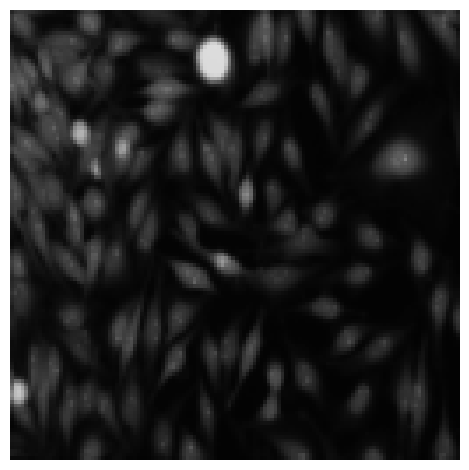

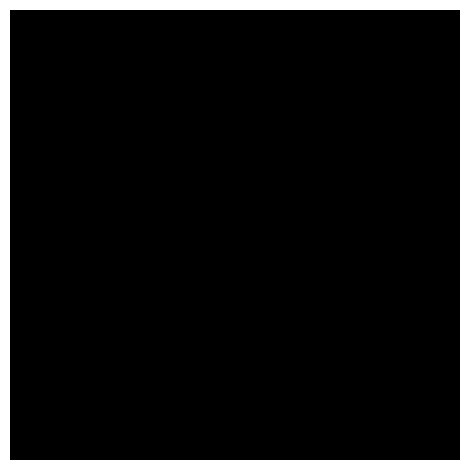

In [37]:
image_x = random.randint(0, len(x_train))
plt.axis("off")
imshow(x_train[image_x])
plt.show()
plt.axis("off")
imshow(np.squeeze(y_train[image_x]))
plt.show()

In [39]:
test_images = np.zeros((len(test_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
sizes_test = []
print('Resizing test images')

for n, id_ in tqdm(enumerate(test_ids), total=len(test_ids)):
    path = os.path.join(TEST_PATH, id_)
    img_path = os.path.join(path, 'images', f'{id_}.png')
    img = imread(img_path)

    # Verificar las dimensiones de la imagen
    if img.ndim == 2:  # Escala de grises
        img = np.stack((img,)*3, axis=-1)  # Convertir a RGB duplicando el canal
    elif img.shape[2] > 3:  # Si hay más de 3 canales, tomar solo los primeros 3
        img = img[:, :, :3]  # Eliminar el canal alfa si existe
    elif img.shape[2] < 3:  # Si hay menos de 3 canales, puedes duplicar
        img = np.stack((img,)*3, axis=-1)

    sizes_test.append([img.shape[0], img.shape[1]])
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    test_images[n] = img

print('Done!')

Resizing test images


100%|██████████| 3754/3754 [00:57<00:00, 64.77it/s]

Done!


In [40]:
input_shape = (128, 128, 3)
num_classes = 1

**U-net**

In [42]:
# Build the model
inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

# Contraction path
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
b1 = tf.keras.layers.BatchNormalization()(c1)
r1 = tf.keras.layers.ReLU()(b1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(r1)

c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
b2 = tf.keras.layers.BatchNormalization()(c2)
r2 = tf.keras.layers.ReLU()(b2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(r2)

c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
b3 = tf.keras.layers.BatchNormalization()(c3)
r3 = tf.keras.layers.ReLU()(b3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(r3)

c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
b4 = tf.keras.layers.BatchNormalization()(c4)
r4 = tf.keras.layers.ReLU()(b4)
p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(r4)

c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
b5 = tf.keras.layers.BatchNormalization()(c5)
r5 = tf.keras.layers.ReLU()(b5)
c5 = tf.keras.layers.Dropout(0.3)(r5)
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

# Expansive path
u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
u6 = tf.keras.layers.BatchNormalization()(u6)
u6 = tf.keras.layers.ReLU()(u6)

u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(u6)
u7 = tf.keras.layers.concatenate([u7, c3])
u7 = tf.keras.layers.BatchNormalization()(u7)
u7 = tf.keras.layers.ReLU()(u7)

u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(u7)
u8 = tf.keras.layers.concatenate([u8, c2])
u8 = tf.keras.layers.BatchNormalization()(u8)
u8 = tf.keras.layers.ReLU()(u8)

u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(u8)
u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
u9 = tf.keras.layers.BatchNormalization()(u9)
u9 = tf.keras.layers.ReLU()(u9)

outputs = tf.keras.layers.Conv2D(num_classes, (1, 1), activation='sigmoid')(u9)

model_unet = tf.keras.Model(inputs=[inputs], outputs=[outputs])
model_unet.compile(optimizer=Adam(learning_rate=0.005), loss='binary_crossentropy', metrics=['accuracy'])
model_unet.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 128, 128,  │        448 │ input_layer_1[0]… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 128, 128,  │          0 │ conv2d_11[0][0]   │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 128, 128,  │      2,320 │ dropout_5[0][0]   │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │         64 │ conv2d_12[0][0]   │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_9 (ReLU)      │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 64, 64,    │          0 │ re_lu_9[0][0]     │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_13 (Conv2D)  │ (None, 64, 64,    │      4,640 │ max_pooling2d_4[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_6 (Dropout) │ (None, 64, 64,    │          0 │ conv2d_13[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_14 (Conv2D)  │ (None, 64, 64,    │      9,248 │ dropout_6[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        128 │ conv2d_14[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_10 (ReLU)     │ (None, 64, 64,    │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 32, 32,    │          0 │ re_lu_10[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_15 (Conv2D)  │ (None, 32, 32,    │     18,496 │ max_pooling2d_5[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_7 (Dropout) │ (None, 32, 32,    │          0 │ conv2d_15[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_16 (Conv2D)  │ (None, 32, 32,    │     36,928 │ dropout_7[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        256 │ conv2d_16[0][0] 

 Total params: 1,400,033 (5.34 MB)

 Trainable params: 1,398,081 (5.33 MB)

 Non-trainable params: 1,952 (7.62 KB)

In [43]:
callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')]

model_unet.fit(x_train, y_train, validation_data=(x_test,y_test), batch_size=16, epochs=25, callbacks=callbacks)

Epoch 1/25


c:\Users\PC\miniconda3\Lib\site-packages\keras\src\models\functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor_47']. Received: the structure of inputs=*
  warnings.warn(


188/188 ━━━━━━━━━━━━━━━━━━━━ 45s 214ms/step - accuracy: 0.9228 - loss: 0.2830 - val_accuracy: 0.9517 - val_loss: 0.1532
Epoch 2/25
188/188 ━━━━━━━━━━━━━━━━━━━━ 40s 212ms/step - accuracy: 0.9555 - loss: 0.1333 - val_accuracy: 0.9521 - val_loss: 0.1609
Epoch 3/25
188/188 ━━━━━━━━━━━━━━━━━━━━ 40s 212ms/step - accuracy: 0.9547 - loss: 0.1258 - val_accuracy: 0.9519 - val_loss: 0.1945


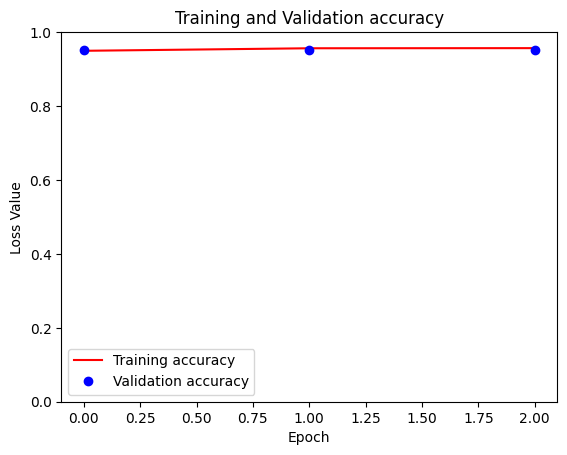

In [44]:
#Training and Validation accuracy
accuracy = model_unet.history.history['accuracy']
val_accuracy = model_unet.history.history['val_accuracy']

plt.figure()
plt.plot( accuracy, 'r', label='Training accuracy')
plt.plot( val_accuracy, 'bo', label='Validation accuracy')
plt.title('Training and Validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.legend()
plt.show()

* ResNet50 with transfer learning* -> este si no se que sea pero ahi venia jajaja

In [49]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50

# Definir el modelo ResNet
model_resnet_tf = tf.keras.Sequential([
    ResNet50(weights='imagenet', include_top=False, input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS)),
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(num_classes, activation='softmax')  # Ajustar según el número de clases
])

model_resnet_tf.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 9s 0us/step


In [55]:
# Ajusta esta línea
outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(u9)  # Cambiar a 1 para binario

# Asegúrate de que las etiquetas son del tipo correcto
y_train = y_train.astype(np.float32)  # O ajustar según sea necesario
y_test = y_test.astype(np.float32)

# Compila el modelo
model_resnet_tf.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


Resultados de ambos modelos , tanto el U-net como el ResNet50

In [56]:
def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Input image', 'True mask', 'Predicted mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

In [57]:
i = random.randint(0, len(x_test))
sample_image = x_test[i]
sample_mask = y_test[i]

In [70]:
# List of models to predict
models = [model_unet, model_resnet, model_resnet_tf]

# Dictionary to store predictions
predictions = {}

# Iterate through each model and make predictions
for model in models:
    model_name = model.__class__.__name__  # Get the class name of the model
    try:
        predictions[model_name] = model.predict(sample_image[tf.newaxis, ...])[0]
    except Exception as e:
        predictions[model_name] = f"Error: {str(e)}"  # Store the error message

# Now you can access each prediction using predictions['U-Net'], predictions['ResNet'], etc.


In [75]:
print(predictions.keys())


dict_keys(['U-Net', 'ResNet', 'ResNetTF'])


In [84]:
# List of models to predict with their custom names
model_info = {
    "U-Net": model_unet,
    "ResNet": model_resnet,
    "ResNetTF": model_resnet_tf,
}

# Dictionary to store predictions
predictions = {}

# Iterate through each model and make predictions
for model_name, model in model_info.items():
    try:
        predictions[model_name] = model.predict(sample_image[tf.newaxis, ...])[0]
    except Exception as e:
        predictions[model_name] = f"Error: {str(e)}"  # Store the error message

# Print the keys of the predictions dictionary
print(predictions.keys())

dict_keys(['U-Net', 'ResNet', 'ResNetTF'])


este de abajo es para el u-net

In [87]:
!pip install opencv-python

import numpy as np
import cv2

# Load the image (make sure to provide a valid path)
sample_image = cv2.imread('path_to_image.jpg')

# Check if the image is loaded properly
if sample_image is not None:
    sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)  # Convert to RGB if necessary
    print("Sample image shape:", sample_image.shape)  # This should now work
else:
    print("Error loading image!")

# Now you can proceed with predictions


   ---------------------------------------- 0.0/38.8 MB ? eta -:--:--
   - -------------------------------------- 1.0/38.8 MB 10.1 MB/s eta 0:00:04
   -- ------------------------------------- 2.9/38.8 MB 8.9 MB/s eta 0:00:05
   ----- ---------------------------------- 5.0/38.8 MB 11.6 MB/s eta 0:00:03
   ------- -------------------------------- 6.8/38.8 MB 9.5 MB/s eta 0:00:04
   --------- ------------------------------ 9.2/38.8 MB 9.8 MB/s eta 0:00:04
   ----------- ---------------------------- 11.5/38.8 MB 10.0 MB/s eta 0:00:03
   ------------- -------------------------- 13.4/38.8 MB 10.0 MB/s eta 0:00:03
   --------------- ------------------------ 15.5/38.8 MB 9.9 MB/s eta 0:00:03
   ------------------ --------------------- 17.6/38.8 MB 10.0 MB/s eta 0:00:03
   -------------------- ------------------- 19.9/38.8 MB 10.1 MB/s eta 0:00:02
   ---------------------- ----------------- 22.0/38.8 MB 10.1 MB/s eta 0:00:02
   ------------------------ --------------- 23.3/38.8 MB 9.8 MB/s eta 

In [89]:
import matplotlib.pyplot as plt
import numpy as np

# Check the shapes
print("Sample image shape:", sample_image.shape)
print("Sample mask shape:", sample_mask.shape)
print("Predicted mask U-Net shape:", predicted_mask_unet.shape)

# Ensure predicted_mask_unet has the correct shape
if predicted_mask_unet.ndim == 2:  # If it's 2D (height, width)
    predicted_mask_unet = np.expand_dims(predicted_mask_unet, axis=-1)  # Add a channel dimension

# Display the images
def display(display_list):
    title = ['Input Image', 'Ground Truth', 'Predicted Mask']
    plt.figure(figsize=(15, 5))
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i + 1)
        plt.title(title[i])
        plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

# Call the display function
display([sample_image, sample_mask, predicted_mask_unet])


AttributeError: 'NoneType' object has no attribute 'shape'

y los dos de abajo son para el otro modelo

In [61]:
display([sample_image, sample_mask, predicted_mask_resnet])

NameError: name 'predicted_mask_resnet' is not defined

In [62]:
display([sample_image, sample_mask, predicted_mask_resnet_tf])

NameError: name 'predicted_mask_resnet_tf' is not defined